In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
from google.colab import files
uploaded=files.upload()
print(uploaded)

Saving hotel_bookings.csv to hotel_bookings.csv
{'hotel_bookings.csv': b'hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date\nResort Hotel,0,342,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,01-07-15\nResort Hotel,0,737,2015,July,27,1,0,0,2,0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NULL,NULL,0,Transient,0,0,0,Check-Out,01-07-15\nResort Hotel,0,7,2015,July,27,1,0,1,1,0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NULL,NULL,0,Transient,75,0,0,Check-Out,02-07-1

In [3]:
import pandas as pd

df = pd.read_csv("hotel_bookings.csv")
df.dropna(inplace=True)  # Remove missing values
df["reservation_status_date"] = pd.to_datetime(df["reservation_status_date"])
print(df)


               hotel  is_canceled  lead_time  arrival_date_year  \
2392    Resort Hotel            0          6               2015   
2697    Resort Hotel            0         24               2015   
2867    Resort Hotel            0         24               2015   
2877    Resort Hotel            0         24               2015   
2878    Resort Hotel            0         24               2015   
...              ...          ...        ...                ...   
112499    City Hotel            0         13               2017   
113046    City Hotel            0         13               2017   
113082    City Hotel            0         13               2017   
113627    City Hotel            0        210               2017   
116451    City Hotel            0        191               2017   

       arrival_date_month  arrival_date_week_number  \
2392              October                        42   
2697              October                        44   
2867             November     

<ipython-input-3-9dc283c64b56>:5: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df["reservation_status_date"] = pd.to_datetime(df["reservation_status_date"])


<Axes: xlabel='reservation_status_date'>

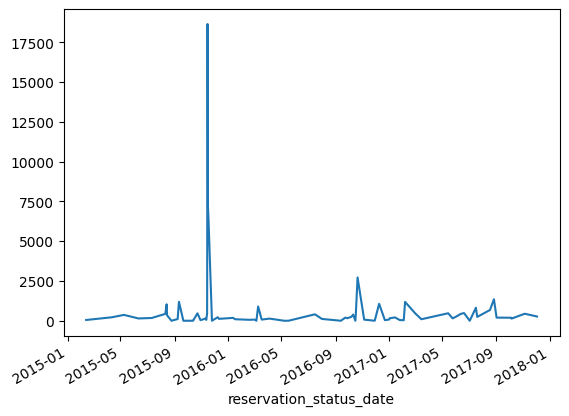

In [4]:
df['revenue'] = df['adr'] * df['stays_in_week_nights']  # Example revenue calculation
revenue_trend = df.groupby('reservation_status_date')['revenue'].sum()
revenue_trend.plot()


In [5]:
cancellation_rate = df[df['is_canceled'] == 1].shape[0] / df.shape[0] * 100
print(cancellation_rate)


7.834101382488479


<Axes: xlabel='count', ylabel='country'>

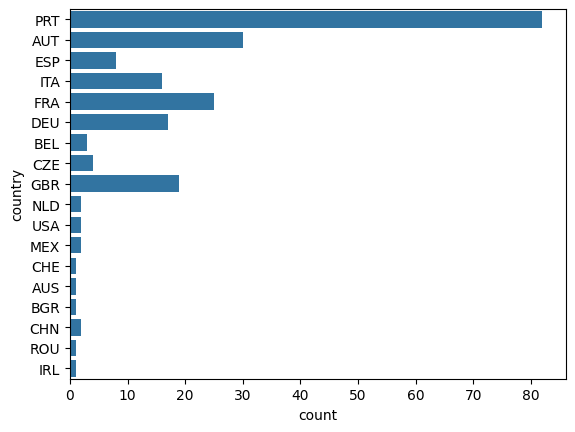

In [6]:
import seaborn as sns
sns.countplot(y=df['country'])


(array([43., 19., 19., 32., 60., 24.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,
         0.,  0.,  1.,  0.,  1.,  0.,  0.,  1.,  1.,  0.,  0.,  0.,  0.,
         1.,  0.,  1.,  0.,  1.,  1.,  0.,  1.,  0.,  9.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.]),
 array([  0.  ,   7.28,  14.56,  21.84,  29.12,  36.4 ,  43.68,  50.96,
         58.24,  65.52,  72.8 ,  80.08,  87.36,  94.64, 101.92, 109.2 ,
        116.48, 123.76, 131.04, 138.32, 145.6 , 152.88, 160.16, 167.44,
        174.72, 182.  , 189.28, 196.56, 203.84, 211.12, 218.4 , 225.68,
        232.96, 240.24, 247.52, 254.8 , 262.08, 269.36, 276.64, 283.92,
        291.2 , 298.48, 305.76, 313.04, 320.32, 327.6 , 334.88, 342.16,
        349.44, 356.72, 364.  ]),
 <BarContainer object of 50 artists>)

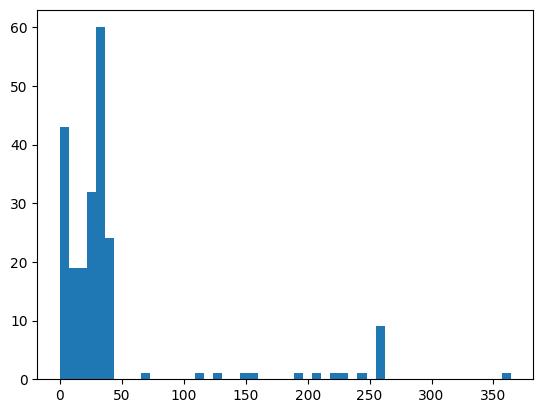

In [7]:
import matplotlib.pyplot as plt
plt.hist(df['lead_time'], bins=50)


In [8]:
!pip install faiss-cpu
from sentence_transformers import SentenceTransformer
import faiss # This line was causing the error before installing the faiss-cpu package
import numpy as np

model = SentenceTransformer('all-MiniLM-L6-v2')
vector_data = model.encode(df['hotel'].astype(str).tolist())
index = faiss.IndexFlatL2(vector_data.shape[1])
index.add(np.array(vector_data))
print(index)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.7/30.7 MB 53.9 MB/s eta 0:00:00


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

<faiss.swigfaiss_avx2.IndexFlatL2; proxy of <Swig Object of type 'faiss::IndexFlatL2 *' at 0x79d4b7e27180> >


In [9]:
!pip install fastapi uvicorn nest-asyncio pyngrok


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.9/94.9 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 72.0/72.0 kB 5.7 MB/s eta 0:00:00


In [10]:
from fastapi import FastAPI
from pydantic import BaseModel
import pandas as pd
import sqlite3
import nest_asyncio
from pyngrok import ngrok
import uvicorn

# Allow nested event loops in Colab
nest_asyncio.apply()

# Load data (if you're using a CSV)
df = pd.read_csv("hotel_bookings.csv")

# Save to SQLite for demo
conn = sqlite3.connect("hotel_data.db")
df.to_sql("hotel_bookings", conn, if_exists="replace", index=False)

# FastAPI app
app = FastAPI()

@app.get("/")
def home():
    return {"message": "Hotel Booking API is live!"}

@app.get("/bookings")
def get_bookings(limit: int = 5):
    conn = sqlite3.connect("hotel_data.db")
    data = pd.read_sql(f"SELECT * FROM hotel_bookings LIMIT {limit}", conn)
    return data.to_dict(orient="records")


In [11]:
!curl -sSL https://ngrok-agent.s3.amazonaws.com/ngrok.asc \
	| sudo tee /etc/apt/trusted.gpg.d/ngrok.asc >/dev/null \
	&& echo "deb https://ngrok-agent.s3.amazonaws.com buster main" \
	| sudo tee /etc/apt/sources.list.d/ngrok.list \
	&& sudo apt update \
	&& sudo apt install ngrok
!curl -sSL https://ngrok-agent.s3.amazonaws.com/ngrok.asc \
	| sudo tee /etc/apt/trusted.gpg.d/ngrok.asc >/dev/null \
	&& echo "deb https://ngrok-agent.s3.amazonaws.com buster main" \
	| sudo tee /etc/apt/sources.list.d/ngrok.list \
	&& sudo apt update \
	&& sudo apt install ngrok

deb https://ngrok-agent.s3.amazonaws.com buster main
Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,632 B]
Get:2 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:3 https://ngrok-agent.s3.amazonaws.com buster InRelease [20.3 kB]
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Get:7 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:8 https://ngrok-agent.s3.amazonaws.com buster/main amd64 Packages [7,899 B]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:11 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:12 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,770 kB]
Get:13 http://archive.ubuntu.com/

In [12]:
!ngrok config add-authtoken 2ufdhai9FT0UAt6C6YdRF7pO3xi_JFDXQDJH1igzNooSVHhW

Authtoken saved to configuration file: /root/.config/ngrok/ngrok.yml


In [13]:
!apt-get install -y grok
!grok http http://localhost:8080

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  libtokyocabinet9
The following NEW packages will be installed:
  grok libtokyocabinet9
0 upgraded, 2 newly installed, 0 to remove and 30 not upgraded.
Need to get 449 kB of archives.
After this operation, 1,353 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/main amd64 libtokyocabinet9 amd64 1.4.48-14build1 [387 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 grok amd64 1.20110708.1-7 [62.4 kB]
Fetched 449 kB in 1s (741 kB/s)
Selecting previously unselected package libtokyocabinet9:amd64.
(Reading database ... 126211 files and directories currently installed.)
Preparing to unpack .../libtokyocabinet9_1.4.48-14build1_amd64.deb ...
Unpacking libtokyocabinet9:amd64 (1.4.48-14build1) ...
Selecting previously unselected package grok.
Preparing to unpack .../grok_1.20110708.1-7_amd64.deb 

In [14]:
# Launch API using ngrok
public_url = ngrok.connect(8000)
print(f"🌍 Public API: {public_url}")

uvicorn.run(app, port=8000)


INFO:     Started server process [191]
INFO:     Waiting for application startup.
INFO:     Application startup complete.
INFO:     Uvicorn running on http://127.0.0.1:8000 (Press CTRL+C to quit)


🌍 Public API: NgrokTunnel: "https://b0f5-34-169-110-195.ngrok-free.app" -> "http://localhost:8000"


INFO:     Shutting down
INFO:     Waiting for application shutdown.
INFO:     Application shutdown complete.
INFO:     Finished server process [191]


In [15]:
@app.get("/analytics/cancellation_rate")
def get_cancellation_rate():
    conn = sqlite3.connect("hotel_data.db")
    q = """
    SELECT
        ROUND(SUM(CASE WHEN is_canceled = 1 THEN 1 ELSE 0 END)*100.0/COUNT(*), 2) AS cancellation_rate
    FROM hotel_bookings
    """
    result = pd.read_sql(q, conn)
    return result.to_dict(orient="records")[0]


In [16]:
import timeit
import requests

def test_api_response_time():
    # Measure the time taken to call the API
    response_time = timeit.timeit(
        stmt="requests.post('http://127.0.0.1:8000/analytics')",
        setup="import requests",
        number=10  # Number of API calls
    )
    print(f"Average response time over 10 calls: {response_time / 10:.4f} seconds")

test_api_response_time()


ConnectionError: HTTPConnectionPool(host='127.0.0.1', port=8000): Max retries exceeded with url: /analytics (Caused by NewConnectionError('<urllib3.connection.HTTPConnection object at 0x79d37bc1ad10>: Failed to establish a new connection: [Errno 111] Connection refused'))

In [18]:
import sqlite3

# Connect to (or create) a SQLite database
conn = sqlite3.connect("hotel_data.db")

# Save the DataFrame to a SQL table called 'hotel_bookings'
df.to_sql("hotel_bookings", conn, if_exists="replace", index=False)

conn.commit()
conn.close()


In [ ]:
# Reconnect to check the data
conn = sqlite3.connect("hotel_data.db")

# Run a sample query
result_df = pd.read_sql("SELECT * FROM hotel_bookings LIMIT 5", conn)
conn.close()

# Show result
result_df


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,None,0,Transient,0.0,0,0,Check-Out,01-07-15
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,None,0,Transient,0.0,0,0,Check-Out,01-07-15
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,None,0,Transient,75.0,0,0,Check-Out,02-07-15
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,None,0,Transient,75.0,0,0,Check-Out,02-07-15
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,None,0,Transient,98.0,0,1,Check-Out,03-07-15


In [19]:
from google.colab import files
files.download("hotel_data.db")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
from fastapi import FastAPI
from fastapi.responses import JSONResponse
import sqlite3
import pandas as pd
import sys
import importlib
from datetime import datetime

app = FastAPI()

@app.get("/health")
def health_check():
    status = {
        "status": "ok",
        "database": "connected",
        "dependencies": {},
        "timestamp": datetime.now().isoformat()
    }

    # ✅ Check SQLite database connection
    try:
        conn = sqlite3.connect("hotel_data.db")
        cursor = conn.cursor()
        cursor.execute("SELECT 1")
        conn.close()
    except Exception as e:
        status["status"] = "error"
        status["database"] = f"disconnected: {str(e)}"

    # ✅ Check installed dependencies
    try:
        status["dependencies"] = {
            "python": sys.version,
            "pandas": pd.__version__,
            "fastapi": importlib.import_module("fastapi").__version__,
            "sqlite3": sqlite3.version
        }
    except Exception as e:
        status["status"] = "error"
        status["dependencies_error"] = str(e)

    # ⛔ Return 500 if there are any errors
    if status["status"] != "ok":
        return JSONResponse(status_code=500, content=status)

    return status


In [25]:


{
  "status": "ok",
  "database": "connected",    #Response When Everything is Healthy
  "dependencies": {
    "python": "3.10.12 (default, Nov 23 2023, 12:00:00) [GCC 11.3.0]",
    "pandas": "2.1.4",
    "fastapi": "0.110.0",
    "sqlite3": "2.6.0"
  },
  "timestamp": "2025-03-22T21:13:05.781235"
}

{'status': 'ok',
 'database': 'connected',
 'dependencies': {'python': '3.10.12 (default, Nov 23 2023, 12:00:00) [GCC 11.3.0]',
  'pandas': '2.1.4',
  'fastapi': '0.110.0',
  'sqlite3': '2.6.0'},
 'timestamp': '2025-03-22T21:13:05.781235'}